# Phân tích giá nhà ở quận King, USA


This dataset contains house sale prices for King County, which includes Seattle. It includes homes sold between May 2014 and May 2015.


## Thêm các thư viện cần thiết

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,PolynomialFeatures
from sklearn.linear_model import LinearRegression
import plotly.express as px
import datetime
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings('ignore')

## Load và xử lý data

Load the csv:


In [3]:
file_name = 'kc_house_data.csv'
df=pd.read_csv(file_name)

We use the method <code>head</code> to display the first 5 columns of the dataframe.


In [4]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


### Chuyển ngày về dạng chuẩn

In [5]:
for i in range(len(df)):
    dateString = str(df['date'][i])[:8]
    dateConverted = datetime.datetime.strptime(dateString, '%Y%m%d').date()
    df['date'][i] = dateConverted

In [6]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [7]:
df.dtypes

id                 int64
date              object
price            float64
bedrooms           int64
bathrooms        float64
sqft_living        int64
sqft_lot           int64
floors           float64
waterfront         int64
view               int64
condition          int64
grade              int64
sqft_above         int64
sqft_basement      int64
yr_built           int64
yr_renovated       int64
zipcode            int64
lat              float64
long             float64
sqft_living15      int64
sqft_lot15         int64
dtype: object

We use the method describe to obtain a statistical summary of the dataframe.


In [8]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


### Xoá bớt những thông tin dư thừa

In [9]:
df.drop(["id", "Unnamed: 0", 'zipcode'], axis= 1, inplace= True, errors= 'ignore')
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15
0,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,47.5112,-122.257,1340,5650
1,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,47.7210,-122.319,1690,7639
2,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,47.7379,-122.233,2720,8062
3,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,47.5208,-122.393,1360,5000
4,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,47.6168,-122.045,1800,7503


We can see we have missing values for the columns <code> bedrooms</code>  and <code> bathrooms </code>


### Xử lý thông tin thiếu

In [10]:
print('Xoá các hàng thông tin bị thiếu (nếu có):')
for feature in df.dtypes.index:
    numberOfNaN = df[feature].isnull().sum()
    print(f" -{feature}: {numberOfNaN}")
    if numberOfNaN != 0:
        df = df[feature].dropna(axis=0)

Xoá các hàng thông tin bị thiếu (nếu có):
 -date: 0
 -price: 0
 -bedrooms: 0
 -bathrooms: 0
 -sqft_living: 0
 -sqft_lot: 0
 -floors: 0
 -waterfront: 0
 -view: 0
 -condition: 0
 -grade: 0
 -sqft_above: 0
 -sqft_basement: 0
 -yr_built: 0
 -yr_renovated: 0
 -lat: 0
 -long: 0
 -sqft_living15: 0
 -sqft_lot15: 0


### Làm tròn phòng tắm

In [11]:
for i in range(len(df)):
    df['bathrooms'][i] = int(round(df['bathrooms'][i]))

In [12]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15
0,2014-10-13,221900.0,3,1.0,1180,5650,1.0,0,0,3,7,1180,0,1955,0,47.5112,-122.257,1340,5650
1,2014-12-09,538000.0,3,2.0,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,47.7210,-122.319,1690,7639
2,2015-02-25,180000.0,2,1.0,770,10000,1.0,0,0,3,6,770,0,1933,0,47.7379,-122.233,2720,8062
3,2014-12-09,604000.0,4,3.0,1960,5000,1.0,0,0,5,7,1050,910,1965,0,47.5208,-122.393,1360,5000
4,2015-02-18,510000.0,3,2.0,1680,8080,1.0,0,0,3,8,1680,0,1987,0,47.6168,-122.045,1800,7503


## Phân tích

### Phân tích trên bản đồ

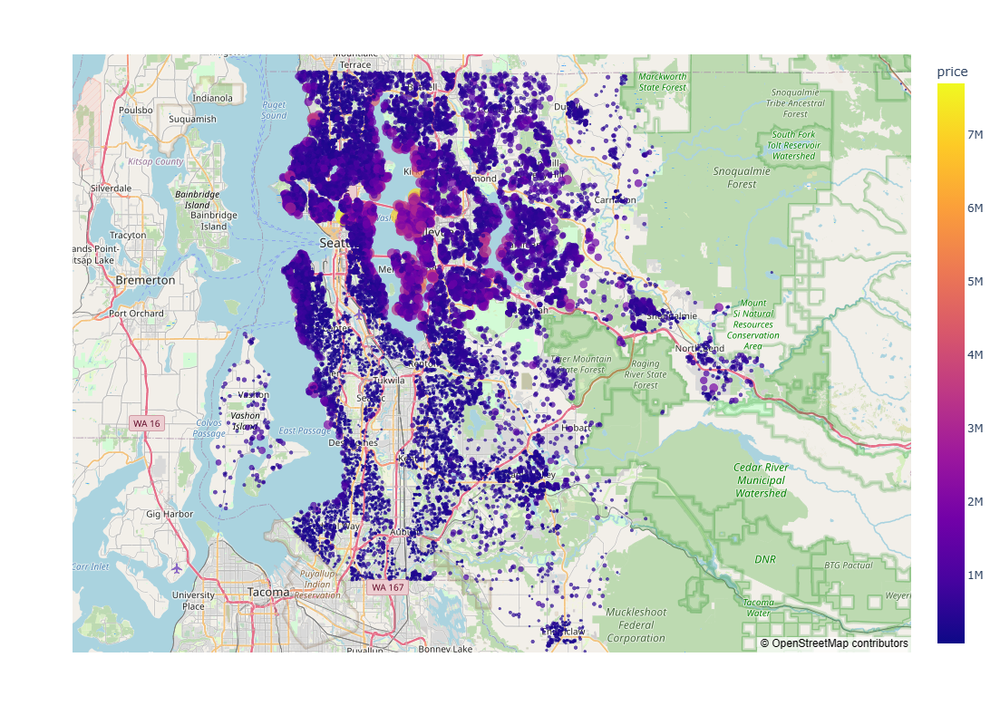

In [13]:
fig = px.scatter_mapbox(
    df,
    lat="lat",
    lon="long",
    size="price",
    color="price",
    size_max=15,
    hover_data=["price", "bedrooms", "bathrooms", "floors"],
    mapbox_style="open-street-map",
    center=dict(lat=47.49, lon=-122.1),
    zoom= 9, 
    height= 800,
    width= 1000
)

# Hiển thị bản đồ
fig.show()

Kết luận:
- Giá nhà tăng khi càng gần ven sông.

### Phân tích số lượng nhà bán theo từng tháng

{10: 1878, 12: 1471, 2: 1250, 5: 2414, 6: 2180, 1: 978, 4: 2231, 3: 1875, 7: 2211, 8: 1940, 11: 1411, 9: 1774}


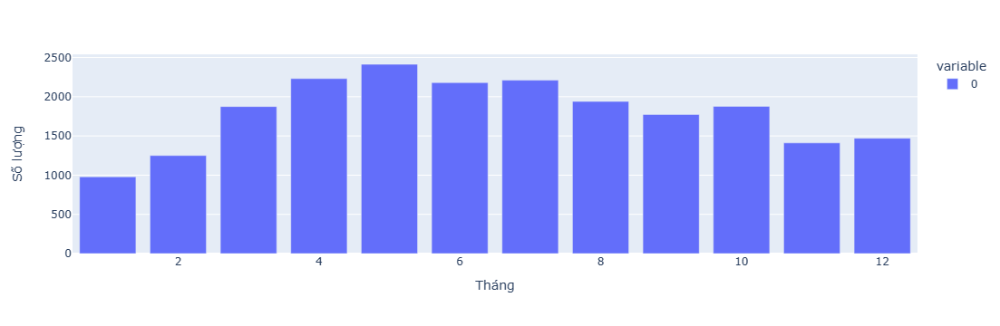

In [14]:
numsPerMonth = {}
for i in range(len(df)):
    month = df['date'][i].month
    numsPerMonth[month] = numsPerMonth.get(month, 0) + 1
    # print(df['date'][i].month)

print(numsPerMonth)
monthlyData = pd.Series(numsPerMonth).sort_index()
fig = px.bar(monthlyData)
fig.update_layout(xaxis_title='Tháng', yaxis_title='Số lượng')
fig.show()

Kết luận:
- Từ tháng 4 đến tháng 7 là có lượng người mua nhà cao nhất. Có thể cân nhắc nên mua/bán ở thời điểm đó.

### Phân tích dựa trên số tầng

<Axes: xlabel='floors', ylabel='price'>

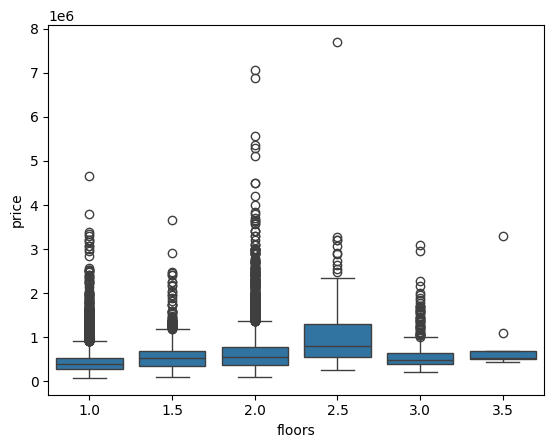

In [15]:
sns.boxplot(data=df, x= 'floors', y= 'price')

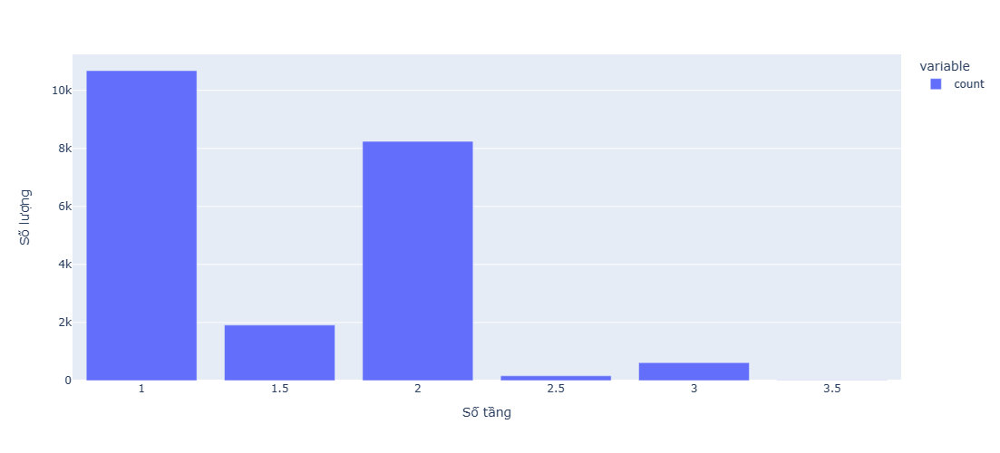

In [16]:
numOfFloors = df.value_counts('floors').to_frame()
fig = px.bar(numOfFloors, height= 500)
fig.update_layout(xaxis_title='Số tầng', yaxis_title='Số lượng')
fig.show()

Kết luận:
- Nhà 1 tầng là phổ biến nhất.
- Giá nhà của tầng 2.5 thường cao hơn mặt bằng chung.

### Phân tích dựa trên mặt tiền

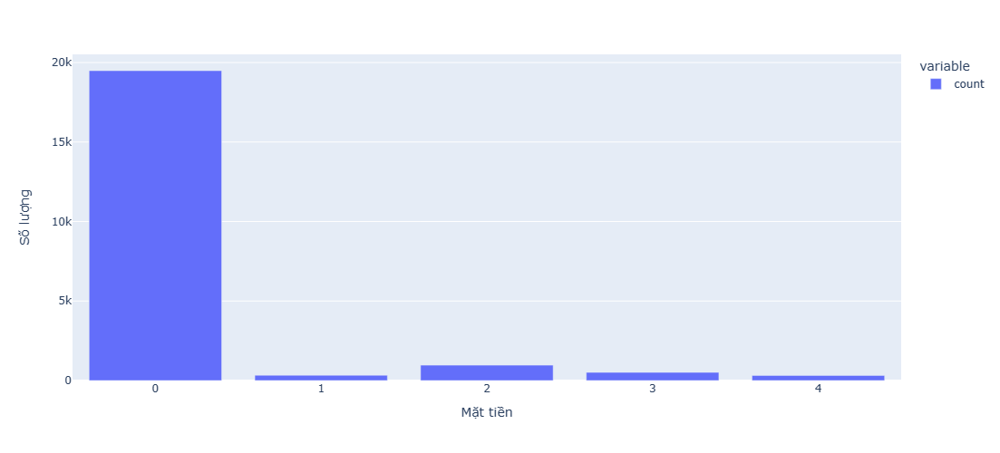

In [17]:
data = df.value_counts('view').to_frame()
fig = px.bar(data, height= 500)
fig.update_layout(xaxis_title='Mặt tiền', yaxis_title='Số lượng')
fig.show()

<Axes: xlabel='view', ylabel='price'>

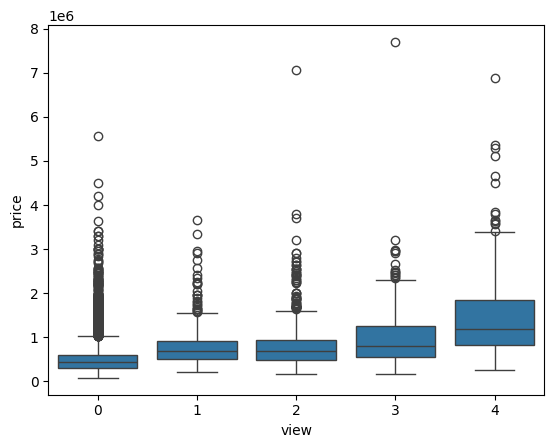

In [18]:
sns.boxplot(data=df, x= 'view', y= 'price')

Kết luận:
- Nhà có càng nhiều mặt tiền thì giá càng đắt.
- Số lượng nhà không có mặt tiền (chung cư) chiếm đa số).

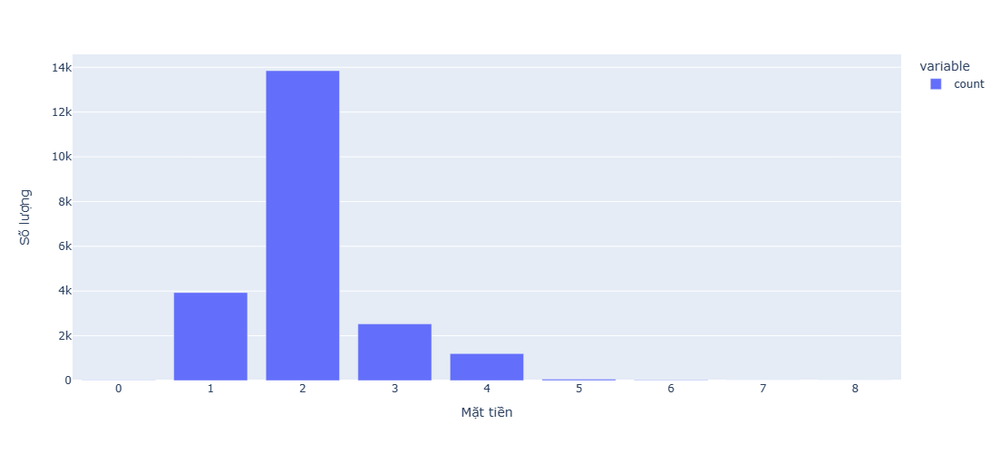

In [19]:
data = df.value_counts('bathrooms').to_frame()
fig = px.bar(data, height= 500)
fig.update_layout(xaxis_title='Mặt tiền', yaxis_title='Số lượng')
fig.show()

<Axes: xlabel='bathrooms', ylabel='price'>

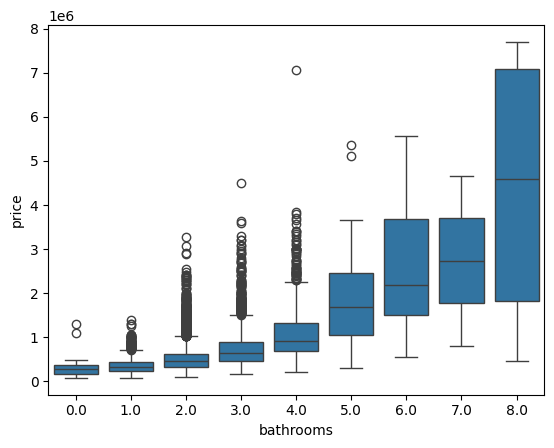

In [20]:
sns.boxplot(data=df, x= 'bathrooms', y= 'price')

In [34]:
import ipywidgets as widgets
from IPython.display import display

w = widgets.FloatSlider(
    value=1,
    min=0,
    max=8,
    step=1,
    description='Bedrooms:',
    layout=widgets.Layout(width='700px')
)

a = widgets.Checkbox(
    value=False,
    description='Not Use'
)

widgets.link((w, 'disabled'), (a, 'value'))

display(widgets.HBox([a,w]))


In [22]:
from IPython.display import display
from ipywidgets import Checkbox

box = Checkbox(False, description='checker')
display(box)

def changed(b):
    w.disabled = True

box.observe(changed)

Checkbox(value=False, description='checker')

We can use the Pandas method <code>corr()</code>  to find the feature other than price that is most correlated with price.


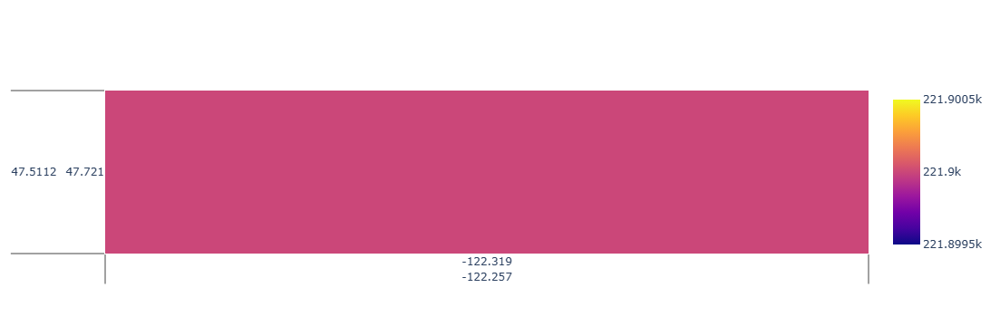

In [23]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Heatmap(
                   z=df['price'].tolist(),
                   x=df[['long']],
                   y=df[['lat']],
                   hoverongaps = False))
fig.show()

In [24]:
X = df[['sqft_living']]
Y = df[['price']]
lm = LinearRegression()
lm.fit(X,Y)
lm.score(X, Y)

0.4928532179037931

In [25]:
features =["floors", "waterfront","lat" ,"bedrooms" ,"sqft_basement" ,"view" ,"bathrooms","sqft_living15","sqft_above","grade","sqft_living"]     

Then calculate the R^2. Take a screenshot of your code.


In [26]:
X = df[features]
Y = df[['price']]
lm = LinearRegression()
lm.fit(X,Y)
lm.score(X, Y)

0.6585997684819601

In [27]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
print("done")

done


We will split the data into training and testing sets:


In [28]:
features =["floors", "waterfront","lat" ,"bedrooms" ,"sqft_basement" ,"view" ,"bathrooms","sqft_living15","sqft_above","grade","sqft_living"]    
X = df[features]
Y = df['price']

x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.15, random_state=1)


print("number of test samples:", x_test.shape[0])
print("number of training samples:",x_train.shape[0])

number of test samples: 3242
number of training samples: 18371


In [29]:
from sklearn.linear_model import Ridge

In [30]:
ridgeModel = Ridge(alpha= 0.1)
ridgeModel.fit(x_train,y_train)
# ridgeModel.predict(x_test)
ridgeModel.score(x_test, y_test)

0.6487138971846775

In [31]:
pr = PolynomialFeatures(degree= 2)
x_train_pr = pr.fit_transform(x_train)
x_test_pr = pr.fit_transform(x_test)

ridgeModel = Ridge(alpha= 0.1)
ridgeModel.fit(x_train_pr,y_train)
ridgeModel.score(x_test_pr, y_test)

0.697936222132636